# Подготовка и оценка пригодности данных о температуре и влажности почвы на разных глубинах для статистического анализа

In [16]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from qgis.core import *
from qgis.analysis import *
import geopandas as gpd

### Привдение данных из текстового файла к стандартным разделителям (пробел)

In [4]:
data_folder='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/hourly02_2019/'
parsed_data_folder='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/p_hourly02_2019/'
for file in os.listdir(data_folder):
    with open (os.path.join(data_folder, file)) as old_file:
        l_list=old_file.readlines()
        for line in l_list:
            while '  ' in line:
                line=line.replace('  ', ' ')
            with open (os.path.join(parsed_data_folder, file), 'a') as new_file:
                new_file.write(line)

### Метаданные набора скачанных данных

| Field | Name | Units |
| --- | --- | --- |
| 1  |   WBANNO  |                        XXXXX |
| 2  |  UTC_DATE  |                      YYYYMMDD |
| 3  |  UTC_TIME  |                      HHmm |
| 4  |   LST_DATE   |                     YYYYMMDD |
| 5  |  LST_TIME  |                      HHmm |
| 6  |   CRX_VN    |                      XXXXXX |
| 7  |   LONGITUDE  |                     Decimal_degrees |
| 8  |   LATITUDE    |                    Decimal_degrees |
| 9  |   T_CALC     |                     Celsius |
| 10 |   T_HR_AVG   |                     Celsius |
| 11 |   T_MAX       |                    Celsius |
| 12 |   T_MIN      |                     Celsius |
| 13 |   P_CALC     |                     mm |
| 14 |   SOLARAD     |                    W/m^2 |
| 15 |  SOLARAD_FLAG  |                  X |
| 16 |   SOLARAD_MAX   |                  W/m^2 |
| 17 |   SOLARAD_MAX_FLAG  |              X |
| 18 |   SOLARAD_MIN      |               W/m^2 |
| 19 |   SOLARAD_MIN_FLAG  |              X |
| 20 |   SUR_TEMP_TYPE  |                 X |
| 21 |   SUR_TEMP       |                 Celsius |
| 22 |   SUR_TEMP_FLAG   |                X |
| 23 |   SUR_TEMP_MAX      |              Celsius |
| 24 |   SUR_TEMP_MAX_FLAG  |             X |
| 25 |   SUR_TEMP_MIN       |             Celsius |
| 26 |   SUR_TEMP_MIN_FLAG  |             X |
| 27 |   RH_HR_AVG          |             % |
| 28 |   RH_HR_AVG_FLAG     |             X |
| 29 |   SOIL_MOISTURE_5     |            m^3/m^3 |
| 30 |   SOIL_MOISTURE_10    |            m^3/m^3 |
| 31 |   SOIL_MOISTURE_20     |           m^3/m^3 |
| 32 |   SOIL_MOISTURE_50    |            m^3/m^3 |
| 33 |   SOIL_MOISTURE_100   |            m^3/m^3 |
| 34 |   SOIL_TEMP_5        |             Celsius |
| 35 |   SOIL_TEMP_10       |             Celsius |
| 36 |   SOIL_TEMP_20      |              Celsius |
| 37 |   SOIL_TEMP_50      |              Celsius |
| 38 |   SOIL_TEMP_100     |              Celsius |

### Отсеивание станций, с большим количеством пропусков в наблюдениях температуры почвы

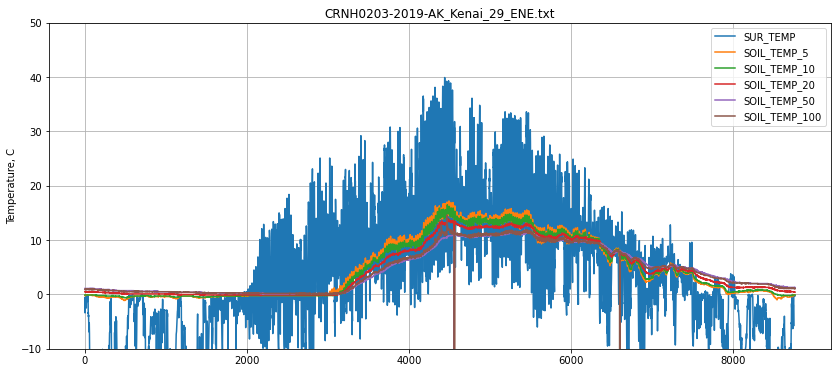

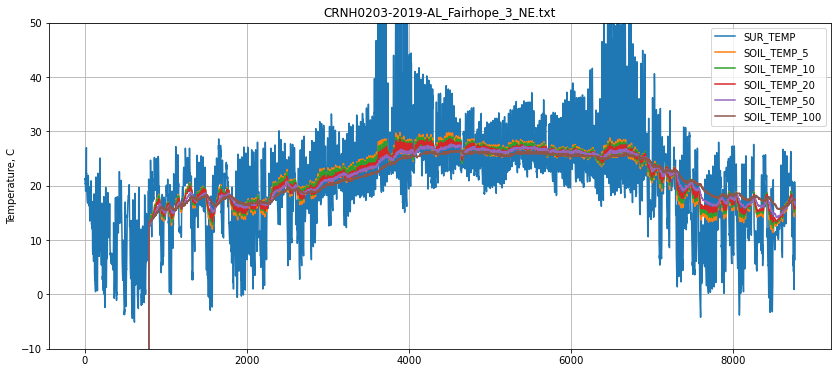

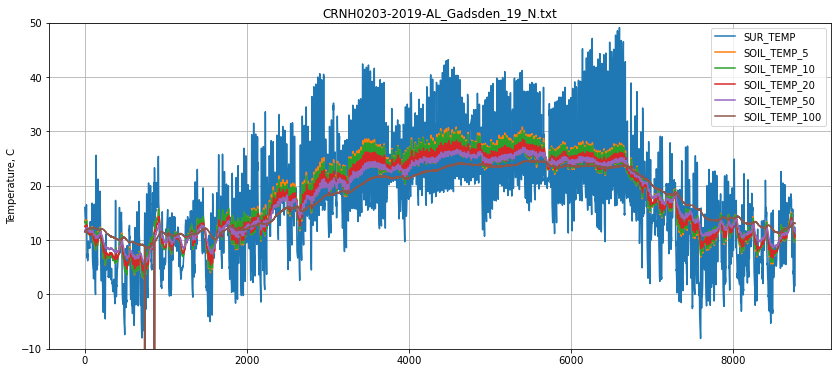

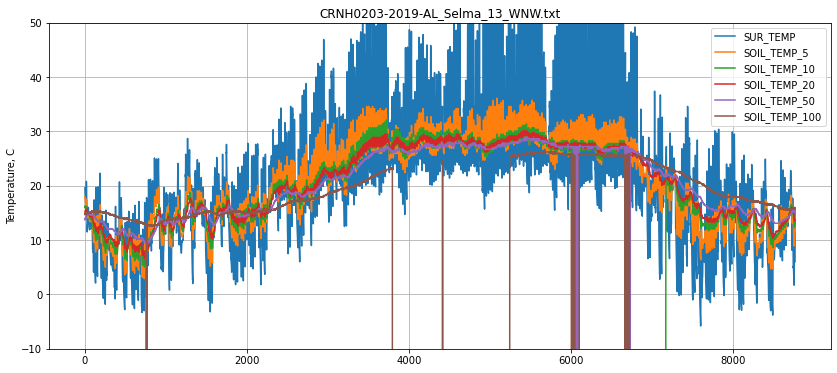

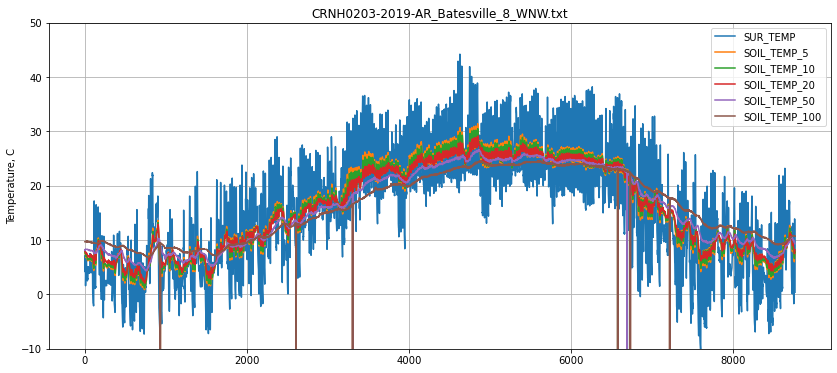

...

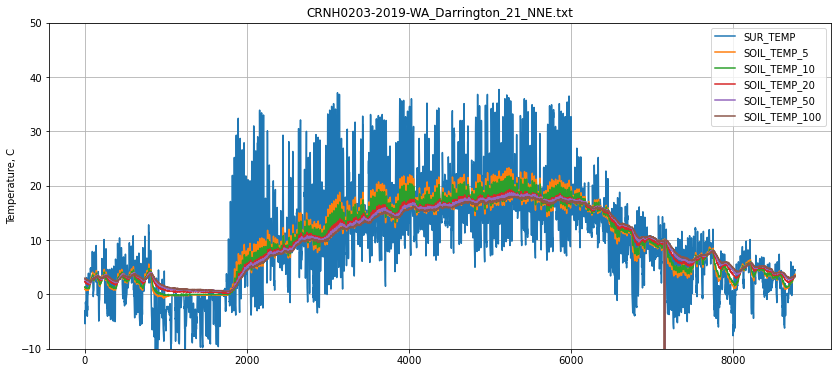

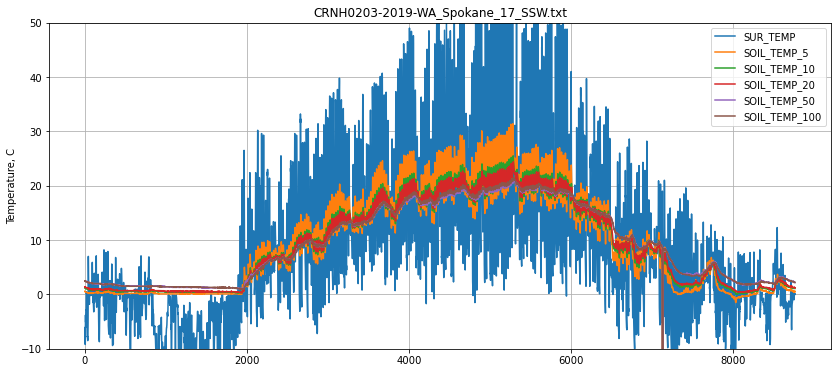

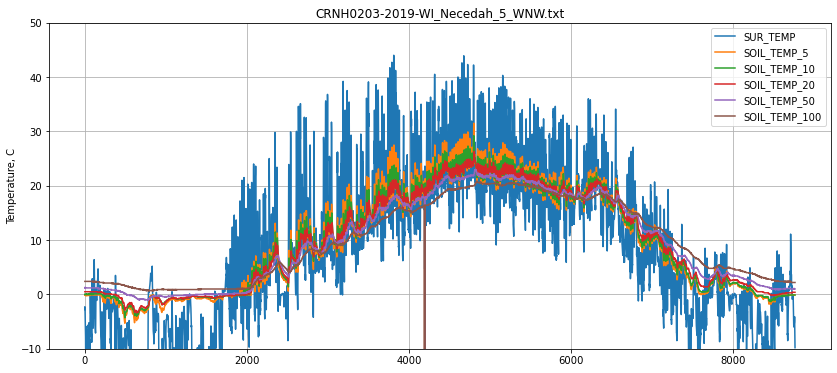

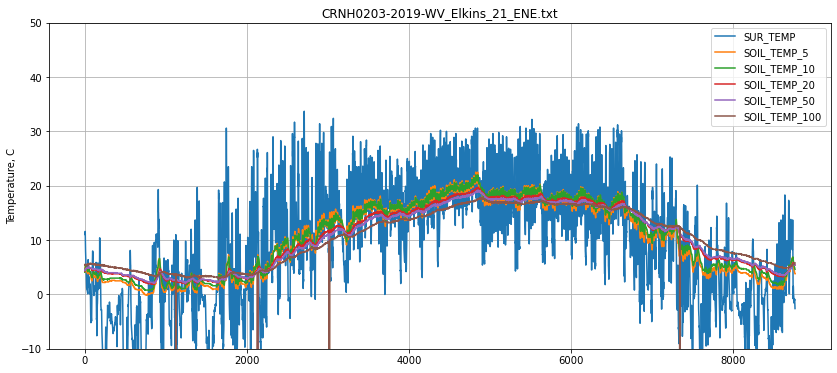

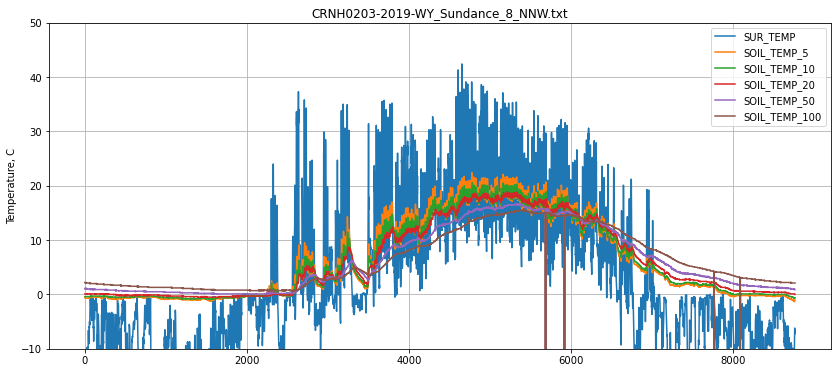

All stations:
156
Invalid stations:
77


In [36]:
invalid_stations=[]
threshold=0.05
parsed_data_folder='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/p_hourly02_2019/'

for file in os.listdir(parsed_data_folder):
    df=pd.read_csv(os.path.join(parsed_data_folder, file), sep=' ', header=None)
    #print(df)
    SUR_TEMP=df[20]
    SOIL_TEMP_5=df[33]
    SOIL_TEMP_10=df[34]
    SOIL_TEMP_20=df[35]
    SOIL_TEMP_50=df[36]
    SOIL_TEMP_100=df[37]
    
    numbers=np.arange(len(SUR_TEMP))
    
    (unique, counts) = np.unique(SUR_TEMP, return_counts=True)
    unique_values=dict(zip(unique, counts))    
    if -9999 in unique_values.keys() and unique_values[-9999]>len(SUR_TEMP)*(1-threshold):
        #print('Dataset %s has too mush misses SUR_TEMP' % file)
        invalid_stations.append(file)       
    
    
    (unique, counts) = np.unique(SOIL_TEMP_5, return_counts=True)
    unique_values=dict(zip(unique, counts))    
    if -9999 in unique_values.keys() and unique_values[-9999]>len(SUR_TEMP)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_TEMP_5' % file)
        if file not in invalid_stations:
            invalid_stations.append(file)
    
    
    (unique, counts) = np.unique(SOIL_TEMP_10, return_counts=True)
    unique_values=dict(zip(unique, counts))
    if -9999 in unique_values.keys() and unique_values[-9999]>len(SUR_TEMP)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_TEMP_10' % file)
        if file not in invalid_stations:
            invalid_stations.append(file)
            
    (unique, counts) = np.unique(SOIL_TEMP_20, return_counts=True)
    unique_values=dict(zip(unique, counts))
    if -9999 in unique_values.keys() and unique_values[-9999]>len(SUR_TEMP)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_TEMP_20' % file)
        if file not in invalid_stations:
            invalid_stations.append(file)
            
    (unique, counts) = np.unique(SOIL_TEMP_50, return_counts=True)
    unique_values=dict(zip(unique, counts))
    if -9999 in unique_values.keys() and unique_values[-9999]>len(SUR_TEMP)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_TEMP_50' % file)
        if file not in invalid_stations:
            invalid_stations.append(file)
            
    (unique, counts) = np.unique(SOIL_TEMP_100, return_counts=True)
    unique_values=dict(zip(unique, counts))
    if -9999 in unique_values.keys() and unique_values[-9999]>len(SUR_TEMP)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_TEMP_100' % file)
        if file not in invalid_stations:
            invalid_stations.append(file)
    
    else:
        plt.rcParams['figure.figsize'] = [14, 6]
        fig, ax = plt.subplots()
        ax.plot(numbers, SUR_TEMP, label='SUR_TEMP')
        ax.plot(numbers, SOIL_TEMP_5, label='SOIL_TEMP_5')
        ax.plot(numbers, SOIL_TEMP_10, label='SOIL_TEMP_10')
        ax.plot(numbers, SOIL_TEMP_20, label='SOIL_TEMP_20')
        ax.plot(numbers, SOIL_TEMP_50, label='SOIL_TEMP_50')
        ax.plot(numbers, SOIL_TEMP_100, label='SOIL_TEMP_100')
        ax.grid()
        ax.set(ylabel='Temperature, C',title=file)
        plt.ylim((-10,50))
        plt.legend()
        plt.show()     
        
#print('Invalid_stations:')        
#print(invalid_stations)  
print('All stations:')
print(len(os.listdir(parsed_data_folder)))
print('Invalid stations:')
print(len(invalid_stations))

### Запись файла с подходящими станциями (температура)

In [76]:
stations_df=pd.read_csv('C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/valid_stations.csv', sep=';', header = None)
for index, row in stations_df.iterrows():
    prefix='CRNH0203-2019-'
    file_name=(prefix+row[2]+'_'+row[3]+'_'+row[4]+'.txt').replace(' ', '_')
    if file_name not in invalid_stations:
        with open ('C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/### Отсеивание станций, с большим количеством пропусков в наблюдениях температуры почвы.csv', 'a') as file:
            file.write(str(row[0])+';'+str(row[1])+';'+str(row[2])+';'+str(row[3])+';'+str(row[4])+';'+str(row[5])+';'+str(row[6])+';'+str(row[7])+';'+str(row[8])+';'+str(row[9])+';'+str(row[10])+';'+str(row[11])+';'+str(row[12])+';'+str(row[13])+';'+str(row[14])+';'+str(row[15])+'\n')

### Отсеивание станций, с большим количеством пропусков в наблюдениях влажности почвы

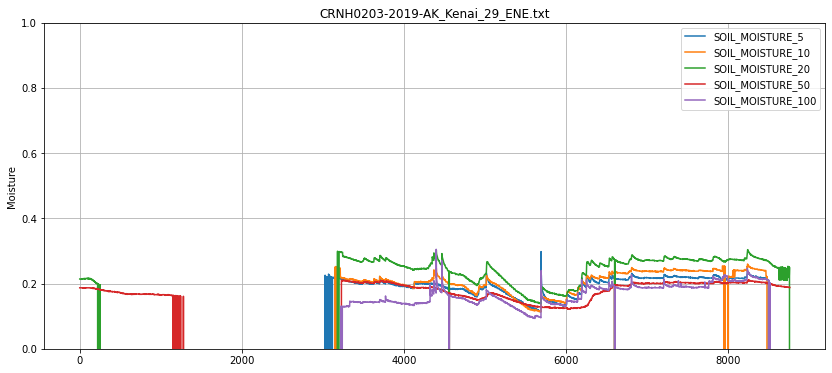

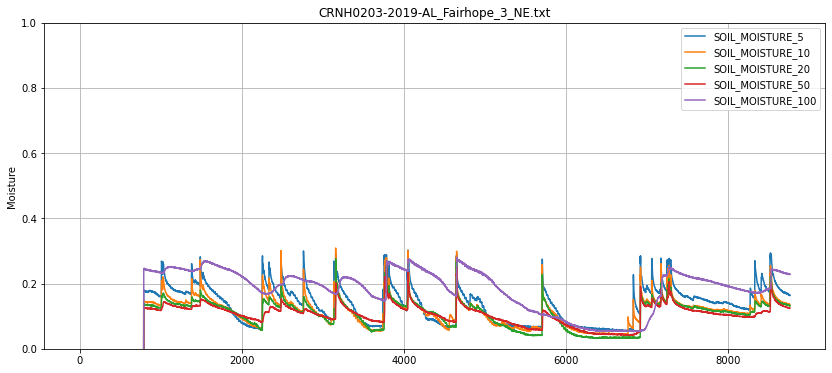

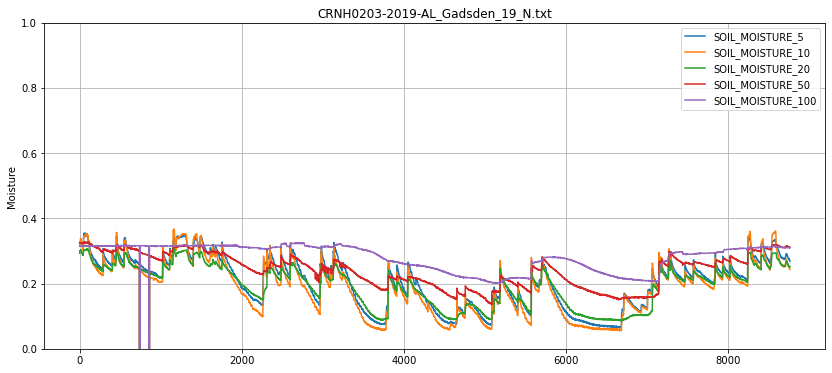

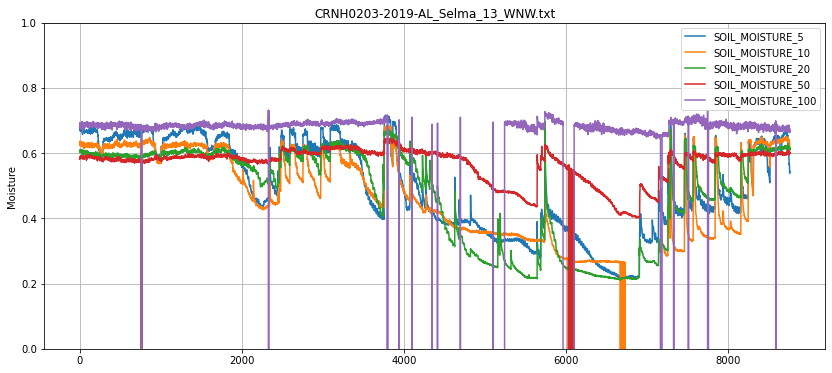

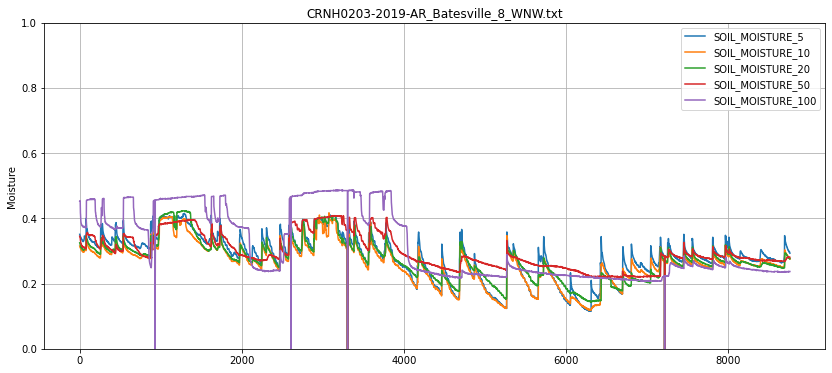

...

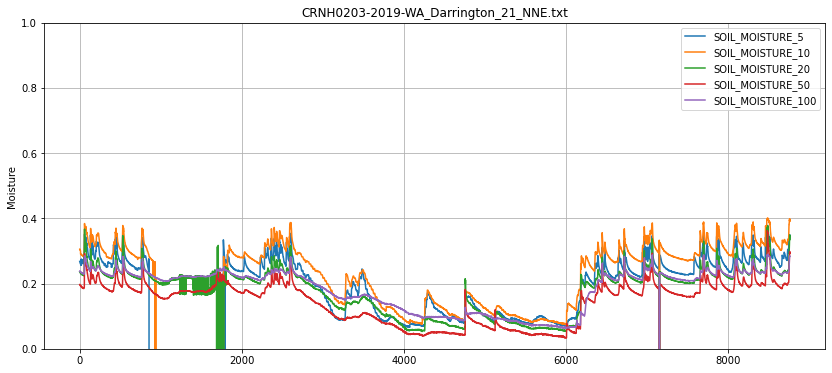

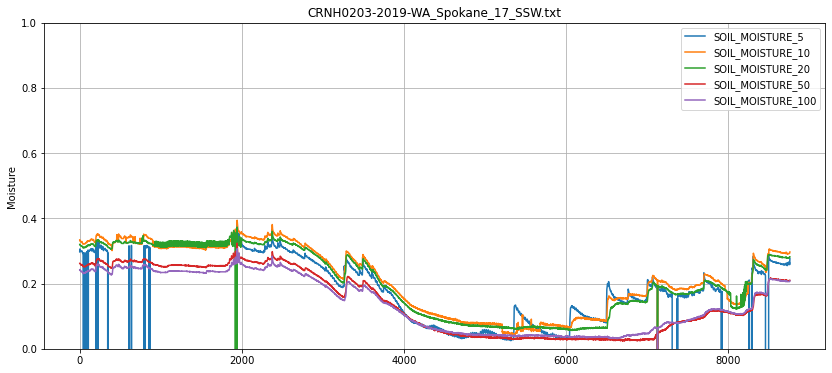

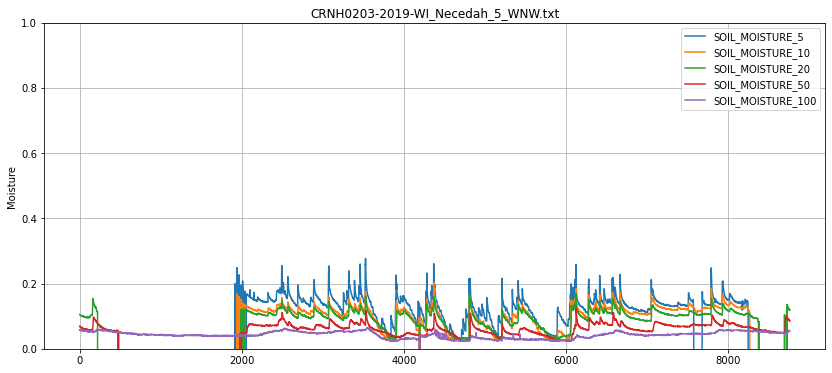

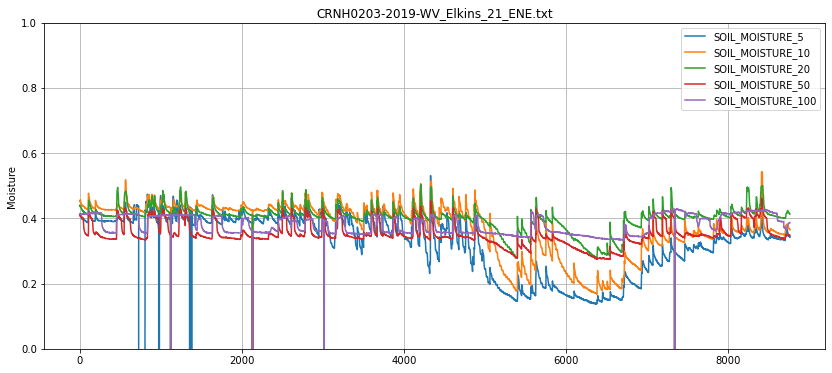

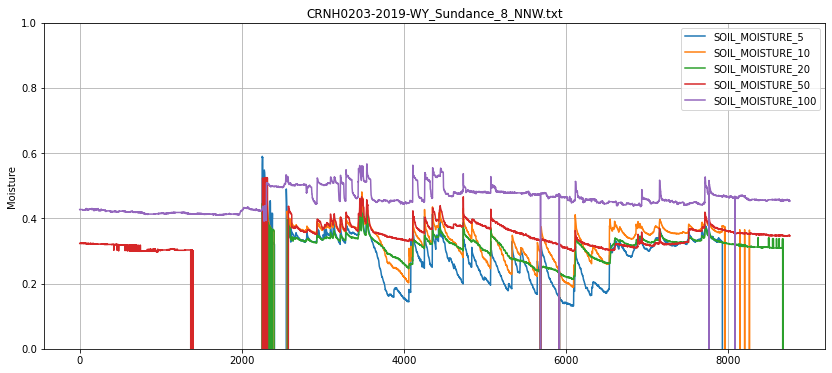

invalid_stations_by_moisture:
['CRNH0203-2019-AK_Aleknagik_1_NNE.txt', 'CRNH0203-2019-AK_Bethel_87_WNW.txt', 'CRNH0203-2019-AK_Cordova_14_ESE.txt', 'CRNH0203-2019-AK_Deadhorse_3_S.txt', 'CRNH0203-2019-AK_Denali_27_N.txt', 'CRNH0203-2019-AK_Fairbanks_11_NE.txt', 'CRNH0203-2019-AK_Glennallen_64_N.txt', 'CRNH0203-2019-AK_Gustavus_2_NE.txt', 'CRNH0203-2019-AK_Ivotuk_1_NNE.txt', 'CRNH0203-2019-AK_King_Salmon_42_SE.txt', 'CRNH0203-2019-AK_Metlakatla_6_S.txt', 'CRNH0203-2019-AK_Port_Alsworth_1_SW.txt', 'CRNH0203-2019-AK_Red_Dog_Mine_3_SSW.txt', 'CRNH0203-2019-AK_Ruby_44_ESE.txt', 'CRNH0203-2019-AK_Sand_Point_1_ENE.txt', 'CRNH0203-2019-AK_Selawik_28_E.txt', 'CRNH0203-2019-AK_Sitka_1_NE.txt', 'CRNH0203-2019-AK_St._Paul_4_NE.txt', 'CRNH0203-2019-AK_Tok_70_SE.txt', 'CRNH0203-2019-AK_Toolik_Lake_5_ENE.txt', 'CRNH0203-2019-AK_Yakutat_3_SSE.txt', 'CRNH0203-2019-AL_Brewton_3_NNE.txt', 'CRNH0203-2019-AL_Clanton_2_NE.txt', 'CRNH0203-2019-AL_Courtland_2_WSW.txt', 'CRNH0203-2019-AL_Cullman_3_ENE.txt', 'C

In [38]:
invalid_stations_by_moisture=[]
threshold=0.05

for file in os.listdir(parsed_data_folder):
    df=pd.read_csv(os.path.join(parsed_data_folder, file), sep=' ', header=None)
    #print(df)
    
    SOIL_MOISTURE_5=df[28]
    SOIL_MOISTURE_10=df[29]
    SOIL_MOISTURE_20=df[30]
    SOIL_MOISTURE_50=df[31]
    SOIL_MOISTURE_100=df[32]
    
    numbers=np.arange(len(SOIL_MOISTURE_5))
    
    (unique, counts) = np.unique(SOIL_MOISTURE_5, return_counts=True)
    unique_values=dict(zip(unique, counts))    
    if -99 in unique_values.keys() and unique_values[-99]>len(SOIL_MOISTURE_5)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_MOISTURE_5' % file)
        invalid_stations_by_moisture.append(file)
        
    
    
    (unique, counts) = np.unique(SOIL_MOISTURE_10, return_counts=True)
    unique_values=dict(zip(unique, counts))    
    if -99 in unique_values.keys() and unique_values[-99]>len(SOIL_MOISTURE_10)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_MOISTURE_10' % file)
        if file not in invalid_stations_by_moisture:
            invalid_stations_by_moisture.append(file)
    
    
    (unique, counts) = np.unique(SOIL_MOISTURE_20, return_counts=True)
    unique_values=dict(zip(unique, counts))
    if -99 in unique_values.keys() and unique_values[-99]>len(SOIL_MOISTURE_20)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_MOISTURE_20' % file)
        if file not in invalid_stations_by_moisture:
            invalid_stations_by_moisture.append(file)
            
    (unique, counts) = np.unique(SOIL_MOISTURE_50, return_counts=True)
    unique_values=dict(zip(unique, counts))
    if -99 in unique_values.keys() and unique_values[-99]>len(SOIL_MOISTURE_50)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_MOISTURE_50' % file)
        if file not in invalid_stations_by_moisture:
            invalid_stations_by_moisture.append(file)
            
    (unique, counts) = np.unique(SOIL_MOISTURE_100, return_counts=True)
    unique_values=dict(zip(unique, counts))
    if -99 in unique_values.keys() and unique_values[-99]>len(SOIL_MOISTURE_100)*(1-threshold):
        #print('Dataset %s has too mush misses SOIL_MOISTURE_100' % file)
        if file not in invalid_stations_by_moisture:
            invalid_stations_by_moisture.append(file)
    
    else:
        plt.rcParams['figure.figsize'] = [14, 6]
        fig, ax = plt.subplots()
        ax.plot(numbers, SOIL_MOISTURE_5, label='SOIL_MOISTURE_5')
        ax.plot(numbers, SOIL_MOISTURE_10, label='SOIL_MOISTURE_10')
        ax.plot(numbers, SOIL_MOISTURE_20, label='SOIL_MOISTURE_20')
        ax.plot(numbers, SOIL_MOISTURE_50, label='SOIL_MOISTURE_50')
        ax.plot(numbers, SOIL_MOISTURE_100, label='SOIL_MOISTURE_100')
        ax.grid()
        plt.legend()
        ax.set(ylabel='Moisture',title=file)
        plt.ylim((0,1))
        plt.show()     
        
print('invalid_stations_by_moisture:')        
print(invalid_stations_by_moisture)  
print(len(os.listdir(parsed_data_folder)))
print(len(invalid_stations_by_moisture))

### Запись файла с подходящими станциями (влажность)

In [82]:
stations_df=pd.read_csv('C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/valid_stations.csv', sep=';', header = None)
for index, row in stations_df.iterrows():
    prefix='CRNH0203-2019-'
    file_name=(prefix+row[2]+'_'+row[3]+'_'+row[4]+'.txt').replace(' ', '_')
    if file_name not in invalid_stations_by_moisture:
        with open ('C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/valid_stations_moisture.csv', 'a') as file:
            file.write(str(row[0])+';'+str(row[1])+';'+str(row[2])+';'+str(row[3])+';'+str(row[4])+';'+str(row[5])+';'+str(row[6])+';'+str(row[7])+';'+str(row[8])+';'+str(row[9])+';'+str(row[10])+';'+str(row[11])+';'+str(row[12])+';'+str(row[13])+';'+str(row[14])+';'+str(row[15])+'\n')

### Запись файлов для каждого измерения в течение одного дня (одновременно для всех станций)

In [93]:
stations_df=pd.read_csv('C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/valid_stations_temperature.csv', sep=';', header = None)
parsed_data_folder='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/p_hourly02_2019/'
#список валидных станций
stations_names=[]
for index, row in stations_df.iterrows():
    prefix='CRNH0203-2019-'
    file_name=(prefix+row[2]+'_'+row[3]+'_'+row[4]+'.txt').replace(' ', '_')
    stations_names.append(file_name)
 
for file in os.listdir(parsed_data_folder):
    if file in stations_names:
        file_df= pd.read_csv(os.path.join(parsed_data_folder, file), sep=' ', header = None)
        for index, row in file_df.iterrows(): 
            if row[1]==20190901:#ТОЛЬКО ДЛЯ ОДНОГО ДНЯ - ПОПРОБОВАТЬ
                if row[20]!=-9999 and row[33]!=-9999 and row[34]!=-9999 and row[35]!=-9999 and row[36]!=-9999 and row[37]!=-9999:
                    with open ('C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/01_09_2019_spatial/'+str(row[2])+'.csv', 'a') as spatial_file:
                        spatial_file.write(str(row[0])+';'+str(row[1])+';'+str(row[2])+';'+str(row[3])+';'+str(row[4])+';'+str(row[5])+';'+str(row[6])+';'+str(row[7])+';'+str(row[8])+';'+str(row[9])+';'+str(row[10])+';'+str(row[11])+';'+str(row[12])+';'+str(row[13])+';'+str(row[14])+';'+str(row[15])+';'+str(row[16])+';'+str(row[17])+';'+str(row[18])+';'+str(row[19])+';'+str(row[20])+';'+str(row[21])+';'+str(row[22])+';'+str(row[23])+';'+str(row[24])+';'+str(row[25])+';'+str(row[26])+';'+str(row[27])+';'+str(row[28])+';'+str(row[29])+';'+str(row[30])+';'+str(row[31])+';'+str(row[32])+';'+str(row[33])+';'+str(row[34])+';'+str(row[35])+';'+str(row[36])+';'+str(row[37])+'\n')


['CRNH0203-2019-TX_Monahans_6_ENE.txt', 'CRNH0203-2019-NM_Socorro_20_N.txt', 'CRNH0203-2019-OK_Goodwell_2_E.txt', 'CRNH0203-2019-CO_Montrose_11_ENE.txt', 'CRNH0203-2019-CO_Cortez_8_SE.txt', 'CRNH0203-2019-NM_Los_Alamos_13_W.txt', 'CRNH0203-2019-CO_La_Junta_17_WSW.txt', 'CRNH0203-2019-KS_Oakley_19_SSW.txt', 'CRNH0203-2019-TX_Bronte_11_NNE.txt', 'CRNH0203-2019-NM_Las_Cruces_20_N.txt', 'CRNH0203-2019-WV_Elkins_21_ENE.txt', 'CRNH0203-2019-VA_Cape_Charles_5_ENE.txt', 'CRNH0203-2019-NC_Durham_11_W.txt', 'CRNH0203-2019-PA_Avondale_2_N.txt', 'CRNH0203-2019-OR_John_Day_35_WNW.txt', 'CRNH0203-2019-ID_Murphy_10_W.txt', 'CRNH0203-2019-OR_Riley_10_WSW.txt', 'CRNH0203-2019-WA_Spokane_17_SSW.txt', 'CRNH0203-2019-UT_Brigham_City_28_WNW.txt', 'CRNH0203-2019-MT_Lewistown_42_WSW.txt', 'CRNH0203-2019-OR_Coos_Bay_8_SW.txt', 'CRNH0203-2019-CA_Redding_12_WNW.txt', 'CRNH0203-2019-WA_Darrington_21_NNE.txt', 'CRNH0203-2019-OR_Corvallis_10_SSW.txt', 'CRNH0203-2019-MN_Goodridge_12_NNW.txt', 'CRNH0203-2019-TX_Edin

## Интерполяция пространственных данных по точкам с помощью QGIS API

<AxesSubplot:>

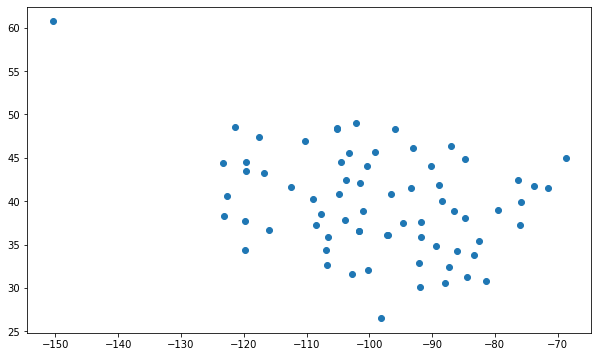

In [39]:
path='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/01_09_2019_spatial/0.csv'
file_df= pd.read_csv(path, sep=';', header = None)
geo_df=gpd.GeoDataFrame(file_df, geometry=gpd.points_from_xy(file_df[6], file_df[7]))
geo_df.set_crs('EPSG:4326', inplace=True)
geo_df.plot()
#geo_df.to_file('C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/01_09_2019_spatial/test.shp', driver='ESRI Shapefile', epsg='4326', encoding = 'utf-8')

In [15]:
pathToFile = "C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/0_test.shp"
extent_file='C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/extent.shp'
layer2 = QgsVectorLayer(extent_file, 'input','ogr')

layer = QgsVectorLayer(pathToFile, 'input','ogr')
layer_data = QgsInterpolator.LayerData()
layer_data.source = layer
layer_data.zCoordInterpolation = False
layer_data.interpolationAttribute = 33
layer_data.sourceType = QgsInterpolator.SourcePoints
ncol = 340
nrows = 800
#interpolation_method = QgsTinInterpolator.Linear
interpolation_method = QgsTinInterpolator.CloughTocher

tin_interpolator = QgsTinInterpolator([layer_data], interpolation_method)
export_path = "C:/Users/Julia/Documents/ITMO/Statistical_data_analysis/1_test.tif"
rect = layer2.extent()

output = QgsGridFileWriter(tin_interpolator, export_path, rect, ncol, nrows)
output.writeFile()

0